# Machine Learning & sklearn

Nous allons maintenant apprendre à utiliser plusieurs algorithmes de Machine Learning (ML).

Le machine learning définit un champ d'algorithmes et de méthodes permettant la prédiction et l'apprentissage à partir d'observations. Il s'agit d'un cadre très général. Notre cours va principalement introduire et faire utiliser des algorithmes d'apprentissage supervisé.

## Modèles Linéaires


Les deux tâches principales en apprentissage supervisé sont la prédiction et la classification d'une valeur $Y$ à partir d'un ensemble de variables (ou *features*) $X_i$. Par exemple:

- Pour la régression, prédire une valeur réelle (par exemple prix d'un appartement, évolution du cours d'une action, etc).
- Pour la classification, prédire l'appartenance d'un élément à une catégorie (par exemple image d'un chien ou d'un chat, transaction bancaire frauduleuse ou non).

### Régression Linéaire

Le modèle de régression linéaire est l'un des plus simples, mais également l'un des plus utilisés en ML.
Une régression linéaire essaye d'expliquer une variable $y$ à partir de plusieurs autres variables $x_i$.

Prenons un modèle très simple en utilisant le dataset FIFA. Nous allons essayer d'expliquer la valeur d'un joueur à partir d'autres variables du dataset.


In [2]:
#load the data
import pandas as pd

fifa = pd.read_csv("./data/fifa.csv")
display(fifa.head(5))

#columns
print(fifa.columns)

,Unnamed: 0,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,27,1987-06-24,169,67,Argentina,...,76,NaN,25,21,20,6,11,15,14,8
1,1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,29,1985-02-05,185,80,Portugal,...,85,NaN,22,31,23,7,11,15,14,11
2,2,9014,https://sofifa.com/player/9014/arjen-robben/15...,A. Robben,Arjen Robben,30,1984-01-23,180,80,Netherlands,...,80,NaN,29,26,26,10,8,11,5,15
3,3,41236,https://sofifa.com/player/41236/zlatan-ibrahim...,Z. Ibrahimović,Zlatan Ibrahimović,32,1981-10-03,195,95,Sweden,...,91,NaN,25,41,27,13,15,10,9,12
4,4,167495,https://sofifa.com/player/167495/manuel-neuer/...,M. Neuer,Manuel Neuer,28,1986-03-27,193,92,Germany,...,37,NaN,25,25,25,87,85,92,90,86


Index(['Unnamed: 0', 'sofifa_id', 'player_url', 'short_name', 'long_name',
       'age', 'dob', 'height_cm', 'weight_kg', 'nationality', 'club_name',
       'league_name', 'league_rank', 'overall', 'potential', 'value_eur',
       'wage_eur', 'player_positions', 'preferred_foot',
       'international_reputation', 'weak_foot', 'skill_moves', 'work_rate',
       'body_type', 'real_face', 'release_clause_eur', 'player_tags',
       'team_position', 'team_jersey_number', 'loaned_from', 'joined',
       'contract_valid_until', 'nation_position', 'nation_jersey_number',
       'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
       'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',
       'gk_positioning', 'player_traits', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_b

#### Modèle Simple Bivarié

Bien que probablement incomplet, nous allons commencer par un modèle simple où nous allons uniquement utiliser le salaire d'un joueur pour expliquer sa valeur. En pratique, notre modèle sera de la forme :  
$$ \text{valeur} = \beta_0 + \beta_1 \text{salaire} $$

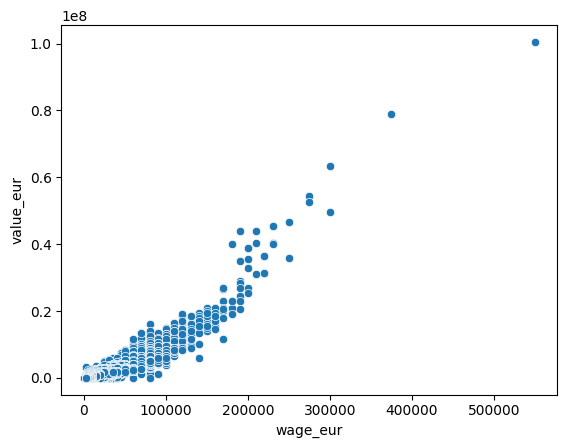

In [3]:
#plot the data
import seaborn as sns

sns.scatterplot(x='wage_eur', y='value_eur', data=fifa); 

La question devient alors : comment optimiser les poids $\beta_0$ et $\beta_1$ tels que la régression $\hat{y_i} = \beta_0 + \beta_1 x_{i}$ soit au plus proche des poids observés $y_i$. En pratique, ces paramètres sont obtenus en minimisant la somme des carrés $$ \sum_{i} (y_i - \hat{y}_i)^2 $$

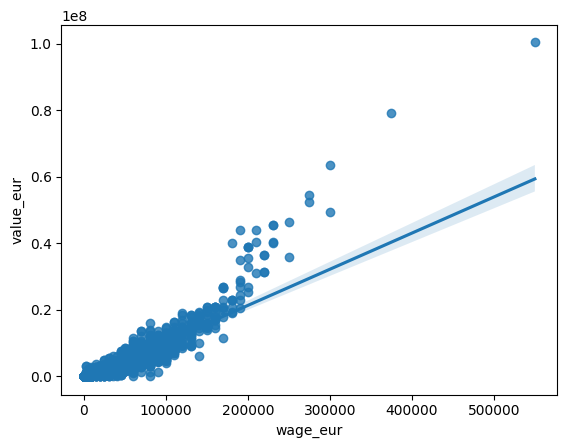

In [4]:
#regplot the data
sns.regplot(x='wage_eur', y='value_eur', data=fifa);

#### **Exercice 1** - Rappel sur la tâche d'optimisation d'une régression linéaire "à la main"

Trouver une méthode d'optimisation simple pour calculer les coefficients optimaux ($\beta_0$, $\beta_1$) de la droite ci-dessus sans l'aide d'une librairie de Machine Learning ? 
Comment évaluer si le modèle optimisé est performant ou pas ? Quel critère utiliser ?

<br>

**Indices** : 
- La droite doit passer, en moyenne, au plus "proche des points". Pour calculer l'erreur entre la droite et les points, utilisez l'erreur quadratique moyenne (mse). L'objectif est donc de minimiser cette erreur...
- Vous devez tester différentes valeurs ($\beta_0$, $\beta_1$) et retenir la meilleure association.
- En s'aidant du graphique, définir précisément les intervalles des paramêtres que vous voulez tester.
- NumPy facilitera vos calculs.
- Tracer la droite obtenue. Est-ce satisfaisant ?

Bonus : On souhaite suivre l'évolution de cette erreur au cours de _l'apprentissage_. Comment faire ?

In [89]:
import numpy as np 
import math 

def get_mse(y_pred, y_true):
    assert len(y_pred) == len(y_true)
    return np.sum((y_true - y_pred)**2)/len(y_pred)

def get_mse_grads(y_pred, y_true, X, m):
    dW = (2 / m) * np.dot(X.T, (y_pred - y_true))
    db = (2 / m) * np.sum(y_pred - y_true)
    return dW, db

# Initialize parameters
W = np.array([0.])  # Initialize as a 1D array with the correct size
b = -1000.

# Learning rate
alpha = 1.383999999e-9

# Storing history of params
params_hist = [(W, b)]
err_hist = []

# Prepare data
y_true = fifa["value_eur"].values
X = fifa["wage_eur"].values.reshape(-1, 1) 

assert len(y_true) == len(X)

prev_err = np.inf
max_iter = 10_000

# Gradient Descent Loop
for i in range(max_iter):
    # Predictions
    y_pred = np.dot(X, W) + b

    # Compute error
    err = get_mse(y_pred, y_true)
    
    # Get gradients
    dW, db = get_mse_grads(y_pred, y_true, X, len(y_true))

    # Update parameters
    W -= dW * alpha
    b -= db * alpha

    # Store history
    params_hist.append((W, b))
    err_hist.append(err)

    print(f"Iteration {i+1}: Error = {err}")
    
    # Stop if improvement is below threshold
    if abs(err - prev_err) < 10:
        print("Converged!")
        break
    prev_err = err

Iteration 1: Error = 9074583144103.992
Iteration 2: Error = 9057425976463.818
Iteration 3: Error = 9040307901542.379
Iteration 4: Error = 9023228830266.674
Iteration 5: Error = 9006188673766.617
Iteration 6: Error = 8989187343374.646
Iteration 7: Error = 8972224750625.246
Iteration 8: Error = 8955300807254.383
Iteration 9: Error = 8938415425199.21
Iteration 10: Error = 8921568516597.541
Iteration 11: Error = 8904759993787.334
Iteration 12: Error = 8887989769306.293
Iteration 13: Error = 8871257755891.506
Iteration 14: Error = 8854563866478.73
Iteration 15: Error = 8837908014202.191
Iteration 16: Error = 8821290112394.035
Iteration 17: Error = 8804710074583.846
Iteration 18: Error = 8788167814498.283
Iteration 19: Error = 8771663246060.543
Iteration 20: Error = 8755196283389.935
Iteration 21: Error = 8738766840801.476
Iteration 22: Error = 8722374832805.475
Iteration 23: Error = 8706020174106.871
Iteration 24: Error = 8689702779605.078
Iteration 25: Error = 8673422564393.375
Iteration 2

In [90]:
print(params_hist[-1])

(array([102.11838244]), np.float64(-1187.7414799870269))


En pratique, on peut calculer un modèle de régression linéaire facilement à l'aide de la [librairie](https://scikit-learn.org/stable/) `sklearn`.  
* En vous aidant du cours, coder toutes les étapes avec `sklearn` : score, paramêtres, valeurs prédites.  
* Comparer avec les coeffficients calculés "à la main".

In [91]:
#votre code 
X = fifa[["wage_eur"]]
y = fifa["value_eur"]

from sklearn.linear_model import LinearRegression 
from sklearn.metrics import mean_squared_error 

model = LinearRegression()

model.fit(X,y)

y_pred = model.predict(X)

mse = mean_squared_error(y, y_pred)

W = model.coef_[0]
b = model.intercept_ 

print(mse, W, b)

1448174586063.4922 108.53781861074228 -356236.4881527724


#### **Exercice 2** - Comprendre l'intérêt du score et d'un modèle de référence "baseline"
- Quel est le score calculé ci-dessus ? Le recalculer "à la main" ?
- Entraînez un modèle simplifié "Dummy" ? Quel type de modèle pouvez-vous choisir ?
- Calculez le score sur ce modèle simplifié et comparez au modèle précédent. Lequel est le plus performant ?

In [93]:
mse_score = (1/len(y))*np.sum((y_pred-y)**2)
mse_score

np.float64(1448174586063.4922)

In [94]:
dummy = np.mean(y)

dummy_score = (1/len(y))*np.sum((dummy-y)**2)
dummy_score

np.float64(7946988803823.891)

In [95]:
dummy_score - mse_score

np.float64(6498814217760.398)

<br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>

Le score associé à un modèle de régression linéaire est le $R^2$, qui mesure le pourcentage de la variance de $y$ qui peut être expliqué par les variables explicatives $x_i$. Plus ce score est proche de 1, plus notre modèle explique correctement $y$.

#### Exercice 3 - Modèle Complet Mulitvarié

Le modèle que nous avons développé est quelque part trop simple. La valeur d'un joueur est en général expliquée par plusieurs variables et non une seule. Il est possible d'utiliser plusieurs variables à votre modèle pour augmenter son pouvoir explicatif (et son score associé, le $R^2$). Attention néanmoins, ajouter plus de variables n'est pas toujours bénéfique au modèle. C'est à votre tour de choisir les meilleures variables pour notre modèle.

**Question 1** Un modèle de régression linéaire n'accepte pas les valeurs manquantes. Remplacer ou supprimer les valeurs manquantes qui vous intéressent dans le dataset.

Voici les colonnes à utiliser pour l'exercice : 

```python
col = [
    "age",
    "height_cm",
    "weight_kg",
    "overall",
    "potential",
    "wage_eur",
    "international_reputation",
    "release_clause_eur",
]
```


In [102]:
col = [
    "age",
    "height_cm",
    "weight_kg",
    "overall",
    "potential",
    "wage_eur",
    "international_reputation",
    "release_clause_eur",
]
X = fifa[col]

X = X.drop("release_clause_eur", axis=1)

In [103]:
X.shape

(16155, 7)

In [104]:

y = fifa["wage_eur"]

model = LinearRegression()
model.fit(X,y)



LinearRegression()

In [105]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet, SGDRegressor

models = {
    "Ridge": Ridge,
    "Lasso": Lasso,
    "ElasticNet": ElasticNet,
    "SGDRegressor": SGDRegressor
}
scores = {}

for model_name, model in models.items(): 
    m = model()
    m.fit(X,y)
    preds = m.predict(X)
    err = mean_squared_error(y, preds)
    scores[model_name] = err 

scores


{'Ridge': 2.4182521286743028e-17,
 'Lasso': 1.8127044191341017e-09,
 'ElasticNet': 1.8127044191341017e-09,
 'SGDRegressor': 1.1355785769089605e+34}

**Question 2** Testez différents modèles de régression linéaire avec différentes colonnes explicatives et comparez leurs scores (si vous voulez automatiser ce processus, allez regarder la fonction `combinations` de la librairie `itertools`). Quel est le meilleur modèle ?

In [12]:
#votre code

**Question 3** En utilisant le meilleur modèle, visualiser le nuage de points entre $y$ et $\hat{y}$. On remarque que plusieurs points ont des valeurs $\hat{y}$ et $y$ très éloignées. Lesquels ? À votre avis, pourquoi ?

In [15]:
#votre code

**Question 4** Finalement, observer les coefficients de notre modèle linéaire. Vous semblent-ils pertinents ? Pourquoi ?

In [18]:
#votre code

### Régression Logistique

La régression logistique est une autre méthode standard d'apprentissage supervisé. Cette dernière permet, de la même manière qu'une régression linéaire, de prédire une variable binaire en fonction de plusieurs variables. On ne peut donc plus utiliser une régression linéaire, vu que l'on cherche à prédire une probabilité. En pratique, cette probabilité est calculée de la manière suivante :

$$ p = \frac{1}{1 + e^{-(\beta_0 + \beta_1 x_1)}} $$

Une fois la probabilité calculée, on choisit un seuil de classification (en général 50%).

$$ \log(\frac{p}{1-p}) \equiv \text{linear regression} $$

Référence: [interpréter les coefficients d'une regression logistique](https://www.polyu.edu.hk/cbs/sjpolit/logisticregression.html) 🥵

#### Exercice 4 - FIFA - Classification et régression logistique.

Nous allons cette fois-ci essayer de prédire si un joueur a plus ou moins de 25 ans à partir de plusieurs variables données.

In [20]:
#colonnes à utiliser
col = ["height_cm", "weight_kg", "overall", "potential", "value_eur", "wage_eur", "international_reputation"]

**Question préliminaire** Contruire X et y sur la base du problème posé.

In [21]:
#votre code

**Question 1** Testez différents modèles de régression logistique et comparez leurs scores (si vous voulez automatiser ce processus, allez regarder la fonction `combinations` de la librairie `itertools`). Quel est le meilleur modèle ?

In [23]:
#votre code

$$\log(\frac{p}{1-p}) = \beta_0 + \beta_1 x_1 + ... + \beta_n x_n$$

**Question 2** Quel est le score associé au meilleur modèle ?
À votre avis, ce score est-il le même que dans une régression linéaire ? Expliquez ce nouveau score.
Construire la matrice de confusion associé (la librairie sklearn peut vous aider, voir aussi [ici](https://youtu.be/Kdsp6soqA7o?si=A4gTr9YQMcwquNb3)) et recalculer ce score "à la main".

In [25]:
#votre code

Lien permettant d'expliquer les différentes métriques de classification 🥵 [ici](https://www.kdnuggets.com/2020/04/performance-evaluation-metrics-classification.html).

**Question 3** Observer les coefficients de notre régression logistique. Comment les interpréter ? Vous semblent-ils pertinents ?

In [29]:
#votre code

#### Exercice 5 - Titanic - Préparer des données (Encoding) et entrainer un modèle

Nous allons faire une pause et s'entraîner sur un autre jeu de données. C'est aussi l'occasion de revoir les bonnes pratiques quant à la gestion d'un nouveau jeu de données. Nous allons travailler sur les données du Titanic.

**Question 1** Charger les données. À votre avis, quel type de prédiction peut-on faire sur ce tableau ? Quel outil associé doit-on utiliser ?

In [31]:
#votre code

**Question 2** Nettoyer les données.
* Détaillez les étapes de "cleaning" et les stratégies associées. Crééer une colonne `family_size`, une colonne `is_alone` et une colonne `title` (en enlevant les titres présents moins de 10 fois dans le dataset).

In [33]:
#votre code

**Question 3** Observer la probabilité de survie pour toutes les colonnes de X. Créér une visualisation de votre choix sur les données du tableau.

In [35]:
#votre code

**Question 4** Le modèle de régression logistique ne permet pas d'utiliser des variables catégoriques directement. Néanmoins, il est possible de transformer ces variables catégoriques en variables binaires à l'aide d'un encodeur, `LabelEncoder`. Encodez les variables nécessaires à l'aide de cet encodeur.

In [37]:
#votre code

**Question 5** Enfin, trouvez le meilleur modèle de régression logistique pour prédire la survie d'un passager du Titanic.  Quel score semble le plus pertinent ?
Que le/la meilleur.e gagne 🏆! Interprétez les coefficients.

In [39]:
#votre codes

C'est la fin de cette partie sur les modèles linéaires !